<a href="https://colab.research.google.com/github/anupsk5053/SCM256/blob/main/Copy_of_Amsterport.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


<center>Final Project</center>

<center>SCM.C51</center>

<!-- <font size="12"><center>Lan Ha & Mykola Oleksyn</center></font> -->

<center>Lan Ha & Mykola Oleksyn</center>

## Problem Statement & Background

The Port of Amsterdam has been experimenting with different technologies to enhance mooring monitoring and predictions. Traditionally, the port’s employee would count the number of ships from surveillance videos and manually input these data points into a database. Another method was to rely on positional signals from the AIS system. While the first method is labor intensive and ineffective in the long-run, the second method is not always reliable. Thus, there is a need to study and deploy an efficient process to monitor the presence of ships. Information on occupancy rates can then be used to analyze historical patterns and to predict future trends. Having more accurate measures of occupancy can help the Port of Amsterdam optimize logistical and business decisions.

Our project aims to provide a proof of concept for an automated process that can enable the Port of Amsterdam to achieve its goals. We leverage a state-of-the-art object detection algorithm called YOLOv5 to demonstrate that if given high-quality inputs, the Port of Amsterdam could incorporate this new technology into monitor mooring occupancy and improve on current practices.


## Methodology
### YOLO Models

YOLO is an acronym for You Only Look Once. It is an object detection algorithm that uses neural networks to provide real-time object detection. The main intuition behind YOLO is that it divides images into a grid system; each cell in the grid is responsible for detecting objects within itself. Furthermore, as the name suggests, YOLO requires only a single forward propagation through a neural network to detect subjects. In other words, prediction is done in a single algorithm run. YOLOv1 was first introduced in 2016 by the paper titled “You Only Look Once: Unified, Real-Time Object Detection” (Redmon et al. 2016). In 2017, the author released “YOLO9000: Better, Faster, Stronger” (Redmon and Farhadi 2017). In 2018, Redmon and Farhadi came up with YOLOv3 “YOLOv3: An Incremental Improvement” (Redmon and Farhadi 2018). In 2020, YOLOv4 was released by a set of new creators (Bochoknovskiy et al. 2020). Within a month of YOLOv4’s publication, Glenn Jocher introduced YOLOv5.

YOLOv5 is about 90% smaller and 180% faster while achieving similar accuracy when compared with YOLOv4.


#### Object Detection
An object detection task can be defined as a combination of object classification and object localization. The former task involves predicting the class of a given object (e.g. docked ship, floating ship, dock, etc.) The latter task, object localization, determines the location of the object by using a bounding box around the object. As a result, object detection algorithms can classify and identify the locations of multiple classes (objects). It seeks to answer two questions: 1) What is the object? and 2) Where is it?

Before YOLO, there have been multiple approaches, such as Fast-RCNN, Faster-RCNN, Retina-Net, etc. A few notable differences between YOLO and region proposal classification networks (Fast-RCNN, Faster-RCNN) are 1) YOLO trains on full images 2) therefore, YOLO can implicitly encode contextual information about object classes and 3) YOLO has greater learning power to generalize well when applied to new domains or unexpected inputs. Fast RCNN can make mistakes on background patches because it does not take into consideration the full image and can miss contextual information. YOLO is known and favored for its superior performance and fast speed.

The YOLO algorithm works based on three techniques: residual blocks, bounding box regression, and intersection over union (IOU).

*Residual blocks*
- First, the image is divided into equal sized grid cells. Each cell is responsible for predicting whether the bounding box center lies in the cell.

*Bounding box*
- To describe the spatial location of an object, YOLO uses bounding boxes. It is one of the simplest techniques of image annotation. These are typically rectangles or polygons that contain the object and its coordinates.  Drawing polygons instead of rectangles enables a more accurate description of our objects of interest (ships) and helps reduce the search area of object features. For example, in the task of looking for ships, the algorithm only searches in the bounding boxes labeled “floating ships” or “docked ships”, rather than looking through the whole image. Therefore, using bounding boxes also reduces computational time.

*Intersection over union (IOU)*
- IOU measures overlap between two bounding boxes: the predicted box and the ground truth box. It is used to measure localization accuracy in object detection models. IOU is calculated as the ratio of the intersection of the boxes and the union of the boxes. IOU is equal to one if the predicted box is the same as the ground truth box. Predictions with IOU equal or greater than the threshold of 0.5 are considered to be positive predictions. YOLO would try to eliminate bounding boxes with low IOU.

#### Non-max suppression
When each grid cell predicts an object label, its bounding box coordinates relative to the cell coordinates, and the probability of the object being in the cell, the algorithm will create duplicate predictions. Multiple grid cells produce predictions for the same object using different bounding boxes. To ensure that the algorithm only detects each object once, it includes the non-max suppression, which suppresses all bounding boxes with lower probability scores. YOLO simply looks at all the probability scores associated with each prediction and chooses the one with the highest score. Then it suppresses the bounding boxes according to their IOU to the current high probability bounding box. YOLO repeats this process until it obtains the final bounding boxes.

#### Anchor box
The first YOLO model has a limitation that it could only predict a single object per cell. While this allows the model to be simple and fast, it does not do well when a cell has more than one object, especially if the task involves detecting smaller objects that might come in groups. In YOLOv2, the authors added anchor boxes; these allow multiple bounding box predictions from a cell. It is worth noting that in YOLOv2, the number of bounding boxes each cell can predict was five. The number five represents a choice that the authors made in order to balance the trade off between model complexity and prediction performance. YOLOv3 only predicts three bounding boxes per cell, but it also makes predictions at three different scales. Thus, the total number of anchor boxes in YOLOv3 is nine.


References:

- Redmon et al. 2016: https://arxiv.org/abs/1506.02640
- Redmon and Farhadi 2017: https://ieeexplore.ieee.org/document/8100173
- Redmon and Farhadi 2018: https://arxiv.org/abs/1804.02767
- Bochoknovskiy et al. 2020: https://arxiv.org/abs/2004.10934


### Architecture

The three main components of a YOLO model are the backbone, neck, and head.

1) Backbone - A convolutional neural network that aggregates and forms image features at different granularities.

2) Neck - A series of layers to mix and combine image features to pass them forward to prediction.

3) Head - Consumes features from the neck and takes box and class prediction steps.

Reference: https://blog.roboflow.com/yolov5-improvements-and-evaluation/

### Data Augmentation

The input of our computer vision model will be a set of 470 photos taken by a GoPro camera at a fixed angle overlooking the port. Approximately 30% of the data are taken at night. As a result, accurate object detection is extremely challenging. Another data limitation is that due to the fixed angle, ships are often blocked by each other. Therefore, we draw boundaries according to our best guess of where the ships would have been if the quays closer to the camera were empty. This approach aligns with best practices of image labeling. Given these constraints, we have a relatively small dataset that needs to be further splitted into train, test, and validation sets.

YOLOv5 is a great choice in such situation because it can handle data augmentation. Using original inputs, YOLOv5 passes training data through a data loader that could scale, adjust color space, and perform mosaic augmentation. Mosaic augmentation is the most novel technique, which combines four images into four tiles of random ratio.

We augment the data by increasing the exposure and brightness of the bounding box. This step would multiply the number of data points by 3, and allow us to train our mini model with a higher level of confidence. We also plan to perform other image and bounding box manipulations.

There are 8 quays in the port, and each can be used to accommodate several ships. Unfortunately, the fact that each quay can accommodate either one or more ships, means that the total port capacity (measured by the number of ships) is a moving target. To tackle this degree of complexity, we plan to explore two approaches:
- Train model to distinguish “primary ships” from “ship satellites,” which are usually docked in parallel.  This way, the port capacity measured in primary vessels would be 16.
- Encode into the model region-specific ship detection. We may decide to predict the status of each quay as either free or occupied. This way, the model no longer counts ships but answers the question, “is there at least one ship parked in this quay?” The sum of occupied quays determines the utilization.


### Tools
#### Roboflow

Roboflow offers a free, user-friendly, and interactive platform to collaborate, label, and manage custom datasets. More importantly, Roboflow can output data in compatible formats with computer vision algorithms such as YOLOv5.

A Roboflow workflow can be summarized by steps:
1. Input images are imported into a Roboflow project
2. Images can be assigned to team members for annotation
3. Each member of the team would manually annotate their assigned images
4. Labeled images are then regrouped to create a data set
5. Customize data:
    1. Train/validation/test ratio
    2. Preprocessing (size, orientation)
    3. Augmentation
    4. Generate compatible data formats
6. Export labeled data


Reference: https://roboflow.com/


#### Poetry

To ensure stability and replicability, we highly recommend using environment and package management tools such as Docker and Poetry. Algorithms used in this project are all subject to future releases and fixes, in which their dependencies might crash and no longer run in harmony. Therefore, code and package dependencies that work today may not work in a week or a month. The numerous packages we rely on might be changed in a way that breaks code compatibility.

There are several potential solutions to such a problem. One way is to use Docker for software containerization or even OS-level virtualization. A more practical approach would be to use Poetry - Python Packaging And Dependency Management.

Poetry creates a virtual environment that replaces the standard package manager PIP. In fact, Poetry is built on top of PIP, but it records divergences in package versions that are being used in a project. So, the workflow of adding packages is very similar - we just replace the term “pip” with the term “poetry”  (e.g., “poetry add pendulum”). Poetry creates a lock file that records not only the version of the package but also a checksum for all the code in that package (even a single changed character in a package will change the checksum). Poetry will ensure that the package we are using is identical to the one used in the original project (where everything was working). There are a few things that are as frustrating and unproductive as tracking and fixing package incompatibilities. Setting up the project and locking the packages using Poetry from the very beginning ensures the long-term seamless functionality of the project.

Reference:
- Poetry: https://python-poetry.org/


## Workflow Manual

### Pipeline Description

1. Import input images to Roboflow for
    1. labelling and
    2. splitting into train, validation, and test sets
2. Use train and validation sets to implement, evaluate, and tune YOLOv5 model
    1. obtain learned weights
3. Implement weights on test sets
    1. obtain predictions
4. Use predictions as inputs for further business cases
    1. monitoring occupancy
    2. time-series forecasting
    
Port of Amsterdam could adjust this pipeline as business needs arise. After the business case and the power of a model are validated in the given context, it might be prudent to start working on automating and streamlining such tasks as import, export, and formatting of the results.

### YOLOv5 Workflow Sample

- Guide: https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data

In [ ]:
from PIL import Image

In [ ]:
# 1. Install Dependencies
# Clone YOLOv5 repository to a specific version
!git clone https://github.com/ultralytics/yolov5  # clone repo
#%cd yolov5
#!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
#from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Cloning into 'yolov5'...
remote: Enumerating objects: 15300, done.
remote: Total 15300 (delta 0), reused 0 (delta 0), pack-reused 15300
Receiving objects: 100% (15300/15300), 14.19 MiB | 17.91 MiB/s, done.
Resolving deltas: 100% (10493/10493), done.
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'
Setup complete. Using torch 1.13.1+cu116 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


In [ ]:
# 2. follow the link below to get your download code from from Roboflow
!pip install -q roboflow
from roboflow import Roboflow

# Change project and data set details (including API)
%cd /content/yolov5
#rf = Roboflow(api_key="")
#project = rf.workspace("").project("")
#dataset = project.version(5).download("")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 3.2 MB/s eta 0:00:00
/content/yolov5


We manually load the data from DropBox without using the roboflow API this time>

In [ ]:
!wget -O Amsterport-5.zip https://www.dropbox.com/s/tm2orukf3cpf58q/Amsterport-5.zip?dl=1

--2023-03-10 17:50:05--  https://www.dropbox.com/s/tm2orukf3cpf58q/Amsterport-5.zip?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6021:18::a27d:4112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/dl/tm2orukf3cpf58q/Amsterport-5.zip [following]
--2023-03-10 17:50:05--  https://www.dropbox.com/s/dl/tm2orukf3cpf58q/Amsterport-5.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucc474b86b8c4da298d70b7ca742.dl.dropboxusercontent.com/cd/0/get/B3-pvMrqSxhi4UeYjamaA-Z_mGqE7ZBey9w5jhq6xgeiWooIfTsskqkmXghkYrT9SmONQtjlJRevhTLdhhwyCjGDvaKB-Yyda0KQq__6yiF0AFJ7VOJ1PWFgYiXm3tyUD8sEHpwImp4HQZCBby7G8xqsOQT8FUlE09JqHJnZ8dkRbQhxFJJsiRLA_iS5jkolsQs/file?dl=1# [following]
--2023-03-10 17:50:06--  https://ucc474b86b8c4da298d70b7ca742.dl.dropboxusercontent.com/cd/0/get/B3-pvMrqSxhi4UeYjamaA-Z_mGqE7ZBey9w5jhq6xg

In [ ]:
!unzip -o "Amsterport-5.zip"

Archive:  Amsterport-5.zip
   creating: Amsterport-5/
   creating: Amsterport-5/train/
  inflating: Amsterport-5/train/labels.cache  
   creating: Amsterport-5/train/labels/
  inflating: Amsterport-5/train/labels/G0010545_JPG.rf.337188177fd5fda1d72ccf21e0a58346.txt  
  inflating: Amsterport-5/train/labels/G0010161_JPG.rf.6a53671682a5b92c4b98c16c703201ac.txt  
  inflating: Amsterport-5/train/labels/G0010811_JPG.rf.610f9f4696935cb2b06febe4df04cdda.txt  
  inflating: Amsterport-5/train/labels/G0010848_JPG.rf.c51ad5f4047be805a76d329831ba366c.txt  
  inflating: Amsterport-5/train/labels/G0010875_JPG.rf.5c21f2e8fb69b8bb231ff78ef771222e.txt  
  inflating: Amsterport-5/train/labels/G0010571_JPG.rf.24cdb03b5422594f77f5048983fab452.txt  
  inflating: Amsterport-5/train/labels/G0010048_JPG.rf.751361c2c1be3d3a37204bb800b8619b.txt  
  inflating: Amsterport-5/train/labels/G0010060_JPG.rf.6f1365b6251614bb3a28fa6977132a32.txt  
  inflating: Amsterport-5/train/labels/G0010430_JPG.rf.c8caa63d6e52ff01880

In [ ]:
dataset_location = '/content/yolov5/Amsterport-5'

In [ ]:
%cat {dataset_location}/data.yaml

names:
- floating-ship
- ships
nc: 2
train: Amsterport-5/train/images
val: Amsterport-5/valid/images


In [ ]:
# 3. Define Model Configuration and Architecture
import yaml
with open(dataset_location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
# customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
# Configuration details
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

### Train YOLOv5

Arguments:
- data: set the path to our yaml file
- cfg: specify our model configuration
- name: result names
- nosave: only save the final checkpoint
- cache: cache images for faster training

Hyperparamters:
- img: define input image size
- batch: determine batch size
- epochs: define the number of training epochs. (Note: often, 3000+ are common here!)
- weights: specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive folder)

In [ ]:
# 4. Training
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset_location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
requirements: YOLOv5 requirement "gitpython" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 4.5 MB/s eta 0:00:00

requirements: 1 package updated per ['gitpython']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/Amsterport-5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=1

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

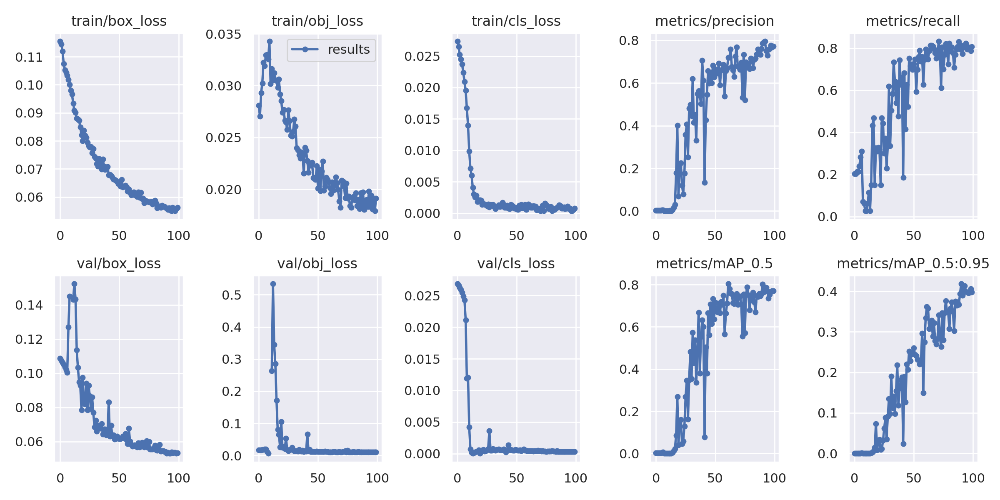

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

### Visualize Training Data with Labels

GROUND TRUTH TRAINING DATA:


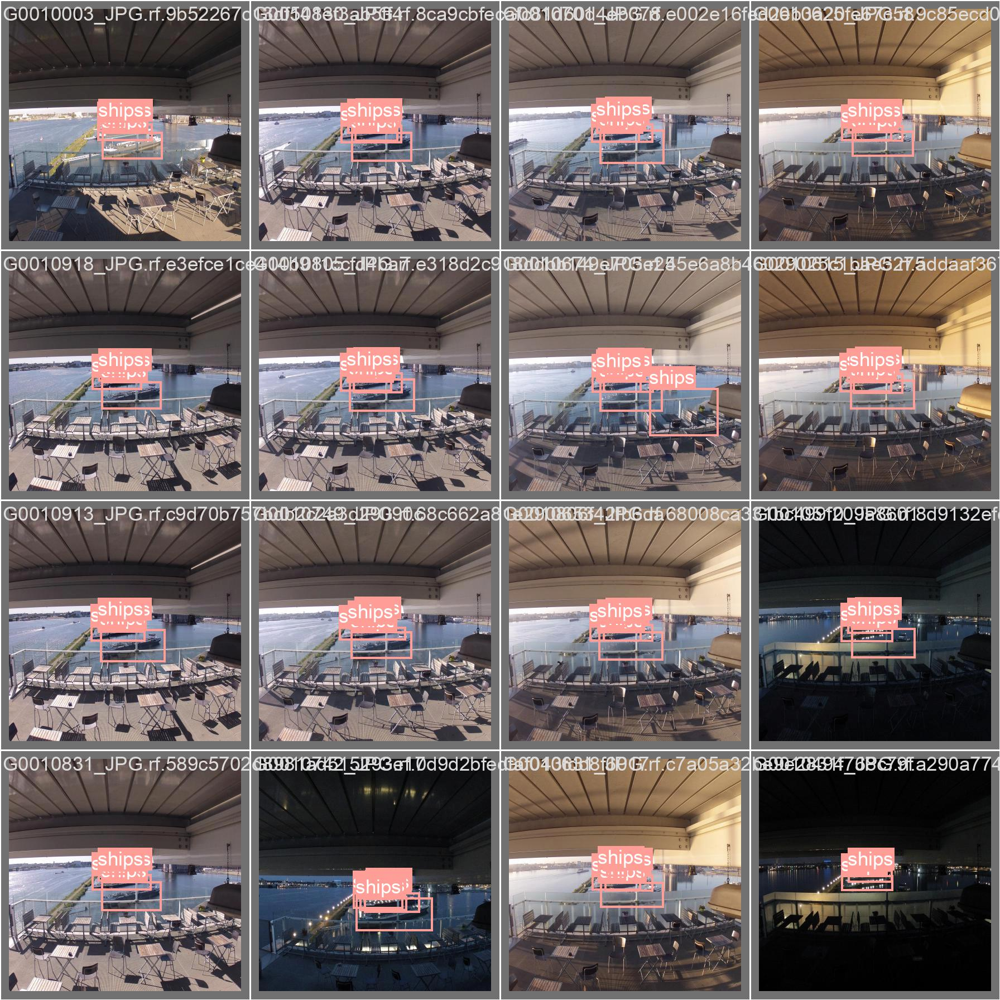

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg',
      width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


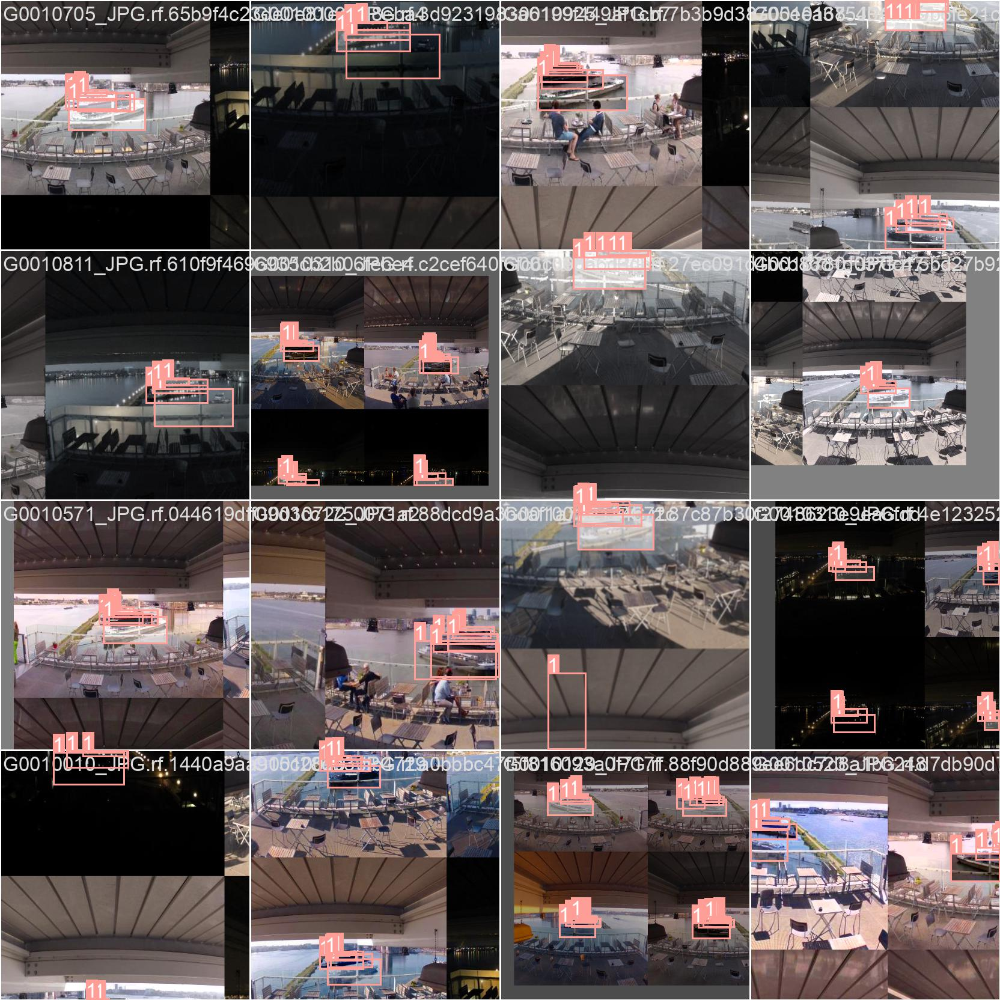

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg',
      width=900)

### Run Inference with Trained Weights

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
!ls /content/yolov5/models/

common.py	     hub	  segment  yolov5l.yaml  yolov5s.yaml
custom_yolov5s.yaml  __init__.py  tf.py    yolov5m.yaml  yolov5x.yaml
experimental.py      __pycache__  yolo.py  yolov5n.yaml


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source Aerial-Maritime-1/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=Aerial-Maritime-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-119-g5543b89 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7249215 parameters, 0 gradients
Traceback (most recent call last):
  File "/content/yolov5/detect.py", line 261, in <module>
    main(opt)
  File "/content/yolov5/detect.py", line 256, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.9/dist-packages/torch/autograd/grad_mode.py", line 27, in decorate_context
    return func(*args, **

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

### Export Trained Weights for Future Inference

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt "/content/gdrive/My Drive"

Mounted at /content/gdrive


Reference:
- Colab workbook for YOLOv5: https://colab.research.google.com/drive/1GdK_ZQbHuTgBzgguBPKi0pUrJni7UHam?usp=sharing#scrollTo=1x_wg3VeiXMW

## Port of Amsterdam Use Case and Recommendations

### Region-specific object detection via image slicing

A major challenge in applying computer vision technique to monitor docked ships was image quality and angle. To simplify the problem space and search space, one solution would be to crop specific dock areas and run the algorithm on these smaller portions of the original image. For example, we can select from a photo only a part of an image that corresponds to a specific quay. Then we can run the same pre-trained model using the cropped portion as inputs. In theory, this could help with computational time and achieve higher accuracy. The benefit of such an approach is that it lets you ask a particular question: Is there a ship in a given quay? This will allow us to count ships more efficiently, as we care less about the position of the ships.

In [ ]:
# Example to crop image
# 1. Import packages
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from PIL.ExifTags import TAGS
import glob
import cv2

In [ ]:
# 2. Import raw image from your directory
#img=Image.open("original_images/G0010215.JPG")

In [ ]:
# 3. Convert input image into a numpy array
#numpydata = np.asarray(img)

# Print with pixel coordinates to calibrate further crop
#numpydata.ndim
#plt.imshow(numpydata)

In [ ]:
# We can see on the image above that the quay #1&2 correspond to a slice of the image ranging about 1100-1900 on the horizontal axis and about 1200-1450 on the vertical axis. We can easily calibrate this by visually inspecting the resulting image. If we have static camera position,
# this approach will work well since we don't need to repeat the calibration.

#Cut a slice from the image
#portion = numpydata[1200:1450, 1100:1850]

# Convert the slice back to image to visually inspect and then save it if it looks ok
#pilImage = Image.fromarray(portion)

In [ ]:
# Import all the images from a particular folder
#images = [cv2.imread(file) for file in glob.glob("original_images/*.JPG")]

#Run a loop to save image slices while changing file names
if False:
  for i in range(len(images)):
    numpydata = asarray(images[i])
    portion = numpydata[1200:1450, 1100:1950]
    pilImage = Image.fromarray(portion)
    plt.savefig("cropped" + str(i) + ".jpg")


Reference:
- Colab workbook on image slicing: https://colab.research.google.com/drive/1iEwWVUF27F5XUjton8EhZFdqrUI7pLx0?usp=sharing#scrollTo=jZxp_Qyc3GxT

### Time-series predictions

Given the predictions on counts of docked ships from images, Port of Amsterdam can leverage these information to forecast time trend and pattern regarding time of day, week, month, or season. Images not only provide visual information, but also metadata on time.

To retrieve metadata:

In [ ]:
# 1. Import packages
from PIL import Image
from PIL.ExifTags import TAGS
import glob
import cv2

In [ ]:
# 2. Import all the images from a particular folder
images = [cv2.imread(file) for file in glob.glob("original_images/*.JPG")]

In [ ]:
# 3. Create a dictionary to store the data
for i in range(len(images)):
  exif = images[i].getexif()
  timedict[str(i) + "quay1"] = exif.get(36867)

*Note: some additional DateTime formatting might be necessary for ensuring compatibility with specific functions and libraries.

Time-series forecasting may be done through several modeling techniques, including ARIMA, SARIMA, and even neural networks. With sufficient data, we can employ a neural network using Prophet, an additive model for non-linear trends that was developed at Facebook Data Science.

References:
- Prophet: https://facebook.github.io/prophet/
- Time-series forecasts for ship counts: https://colab.research.google.com/drive/13BvPlZeH1uIUN0Ha95MVx2ggXC_SO-UW?usp=sharing
- Dataset: https://drive.google.com/file/d/1VBxGLal0ESCWon7SUVobSDxFjUlIJTgq/view
- Colab workbook on image metadata extraction: https://colab.research.google.com/drive/1_k2CqqCd52w5fz9z_mRwfv2fDotC8EJ6?usp=sharing


### Suggestion -- Blurring license plates

From our discussion with the Port of Amsterdam, we learned that privacy concern is a bottleneck to deploying more cameras at more direct angles to monitor ships. This issue hinders the performance and usability of computer vision techniques at the Port. It is our understanding that privacy in the context of port operations primarily means risks regarding storing images that include license plates of the ships.

We would like to suggest an outline of a potential solution to this issue. A model (like the one we presented in the basic workflow notebook) can be trained to identify not only ships but specifically license plates. Such a model can deliver pixel-based coordinates of the location of license plates on images.

If we identify license plates by their pixel coordinates, we can engineer a data workflow to remove the area containing license plates. A code example that does such an operation:


In [ ]:
# 1. Import packages
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from PIL.ExifTags import TAGS
import cv2


In [ ]:
# 2. Import images
# original image
#image = cv2.imread('G0010215.JPG')
#contours = np.array ([[1200,1100],  [1450,1100], [1450,1850],[1200,1850]])

# 3. Create a mask to blank out sensitive information
#mask = np.zeros(image.shape, dtype=np.uint8)
#cv2.fillPoly(mask, pts=[contours], color=(255,255,255))

# 4. Apply the mask
#masked_image = cv2.bitwise_or(image, mask)

# 5. Save the result
#cv2.imwrite('image_masked.png', masked_image)

Reference:
- Colab workbook for sensitive information blurring/masking: https://colab.research.google.com/drive/1YdOM4BSGqFTruTAYSFG5Wy95RQczf0CW?usp=sharing#scrollTo=H7cBwwLnkRTi

## Conclusion

Our project explored the potential of applying one of the most recent and advanced computer vision techniques to a real-world scenario. Unfortunately, due to input data limitations, we were unable to provide strong quantitative evidence that our application can outperform current practices. We are hopeful that our report describes a sound and innovative approach which can inform business decisions and drive future business values for the Port of Amsterdam.

One of our most important takeaways from the project is that the key to a successful deployment of any algorithm lies in how well we can align them with the strategic vision and the goals of the stakeholders of the business. The possibilities of computer vision applications are vast and continue to grow, but blindly applying cutting-edge models does not guarantee desirable outcomes.

We are deeply impressed by the Port of Amsterdam’s leadership vision and guidance. We believe such a proactive approach to developing internal technological capabilities has tremendous benefits and can lead the company into a better future than that of competitors who are more reactive and passive to new technical developments. We hope our overview of the model’s possibilities and specific applications will help the Port of Amsterdam identify viable opportunities for using computer vision in the near future.